In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
dir = "/content/drive/MyDrive/CV_Assignment3/panaroma_generation"

1. Keypoint detection

In [3]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

In [4]:
img1 = cv.imread('/content/drive/MyDrive/CV_Assignment3/panaroma_generation/1.jpg')
gray= cv.cvtColor(img1,cv.COLOR_BGR2GRAY)
sift = cv.SIFT_create()
kp = sift.detect(gray,None)
img11=cv.drawKeypoints(gray,kp,img1,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv.imwrite('sift_keypoints.jpg',img11)

True

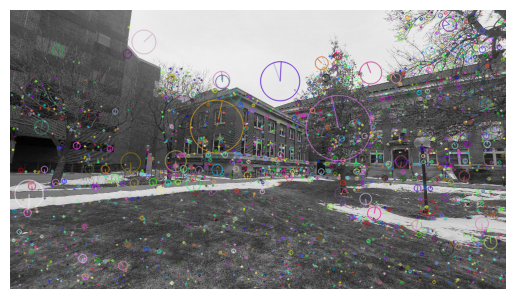

In [5]:
plt.imshow(cv.cvtColor(img11, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [6]:
img2 = cv.imread('/content/drive/MyDrive/CV_Assignment3/panaroma_generation/2.jpg')
gray= cv.cvtColor(img2,cv.COLOR_BGR2GRAY)
sift = cv.SIFT_create()
kp = sift.detect(gray,None)
img22=cv.drawKeypoints(gray,kp,img2,flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv.imwrite('sift_keypoints.jpg',img22)

True

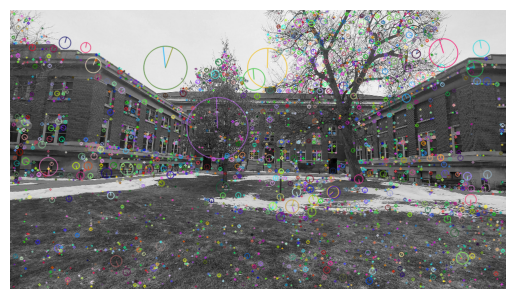

In [7]:
plt.imshow(cv.cvtColor(img22, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

2. Feature matching

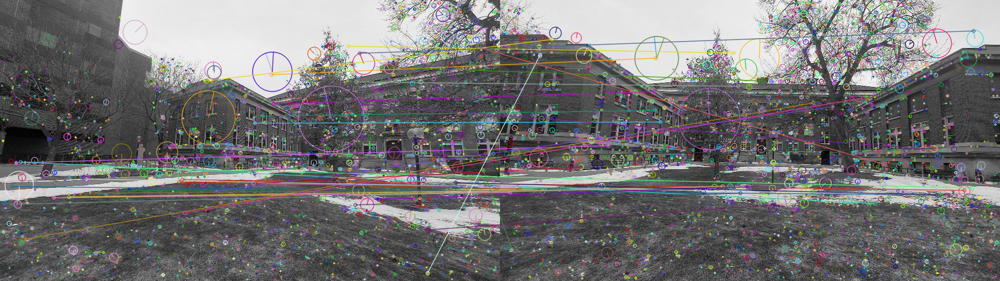

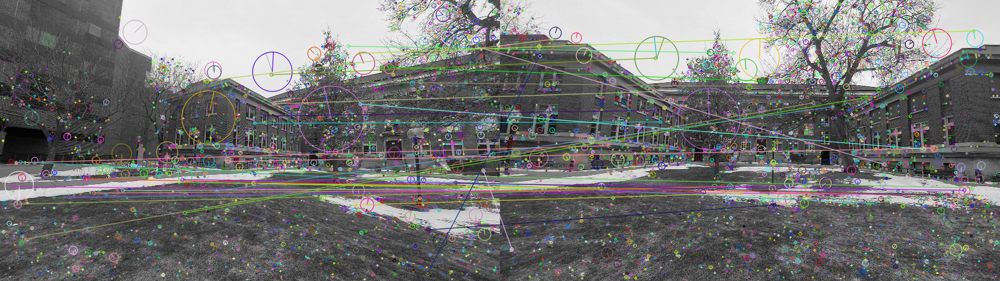

In [8]:
import cv2 as cv
import numpy as np

sift = cv.SIFT_create()
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

bf = cv.BFMatcher()
matches_bf = bf.knnMatch(des1, des2, k=2)

good_matches_bf = []
for m, n in matches_bf:
    if m.distance < 0.75 * n.distance:
        good_matches_bf.append(m)

# flann app
index_params = dict(algorithm=0, trees=5)
search_params = dict(checks=50)
flann = cv.FlannBasedMatcher(index_params, search_params)
matches_flann = flann.knnMatch(des1, des2, k=2)

good_matches_flann = []
for m, n in matches_flann:
    if m.distance < 0.75 * n.distance:
        good_matches_flann.append(m)


bf_matches_img = cv.drawMatches(img1, kp1, img2, kp2, good_matches_bf, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
flann_matches_img = cv.drawMatches(img1, kp1, img2, kp2, good_matches_flann, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
from google.colab.patches import cv2_imshow

cv2_imshow(bf_matches_img)
cv2_imshow(flann_matches_img)


3. Homography Estimation

In [17]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
MIN_MATCH_COUNT = 10

img1 = cv.imread('/content/drive/MyDrive/CV_Assignment3/panaroma_generation/1.jpg', cv.IMREAD_GRAYSCALE)
img2 = cv.imread('/content/drive/MyDrive/CV_Assignment3/panaroma_generation/2.jpg', cv.IMREAD_GRAYSCALE)

sift = cv.SIFT_create()

kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)
flann = cv.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1,des2,k=2)
good = []
for m,n in matches:
 if m.distance < 0.7*n.distance:
  good.append(m)

In [18]:
if len(good)>MIN_MATCH_COUNT:
 src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
 dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
 M, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC,5.0)
 print(M)
 matchesMask = mask.ravel().tolist()
 h,w = img1.shape
 pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
 dst = cv.perspectiveTransform(pts,M)
 img2 = cv.polylines(img2,[np.int32(dst)],True,255,3, cv.LINE_AA)
else:
 print( "Not enough matches are found - {}/{}".format(len(good), MIN_MATCH_COUNT) )
 matchesMask = None

[[-5.50415091e+01  1.64179402e+00  1.97998376e+04]
 [-1.67402292e+01 -3.39656033e+01  1.04049556e+04]
 [-5.72428058e-02 -1.26677228e-03  1.00000000e+00]]


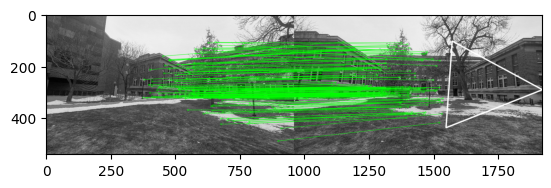

(<matplotlib.image.AxesImage at 0x7dcd9c753220>, None)

In [19]:
draw_params = dict(matchColor = (0,255,0),
 singlePointColor = None,
 matchesMask = matchesMask,
 flags = 2)
img3 = cv.drawMatches(img1,kp1,img2,kp2,good,None,**draw_params)
plt.imshow(img3, 'gray'),plt.show()

4. Perspective warping:

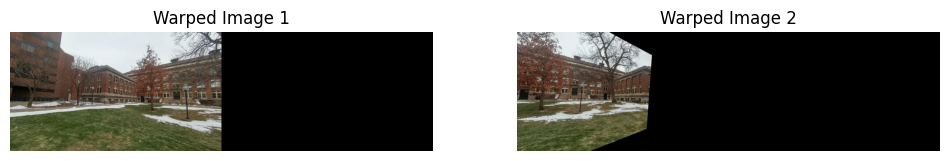

In [44]:
img1 = cv.imread('/content/drive/MyDrive/CV_Assignment3/panaroma_generation/1.jpg')
img2 = cv.imread('/content/drive/MyDrive/CV_Assignment3/panaroma_generation/2.jpg')

def warp_images(image1, image2, H):
    warped_image1 = cv.warpPerspective(image1, np.identity(3), (image2.shape[1] + image1.shape[1], image2.shape[0]))
    warped_image2 = cv.warpPerspective(image2, H, (image1.shape[1] + image2.shape[1], image1.shape[0]))
    return warped_image1, warped_image2

warped_image1, warped_image2 = warp_images(img1, img2, M)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title('Warped Image 1')
plt.imshow(cv.cvtColor(warped_image1, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Warped Image 2')
plt.imshow(cv.cvtColor(warped_image2, cv.COLOR_BGR2RGB))
plt.axis('off')

plt.show()

5. Stitching

In [45]:
img1 = cv.imread('/content/drive/MyDrive/CV_Assignment3/panaroma_generation/1.jpg')
img2 = cv.imread('/content/drive/MyDrive/CV_Assignment3/panaroma_generation/2.jpg')



0


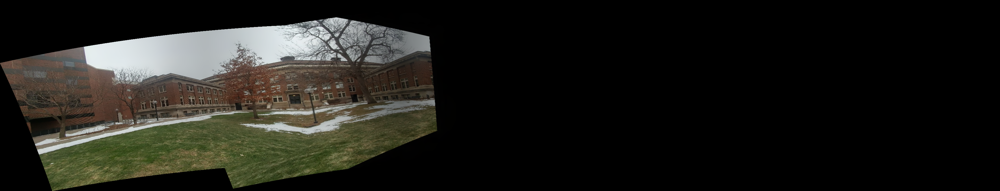

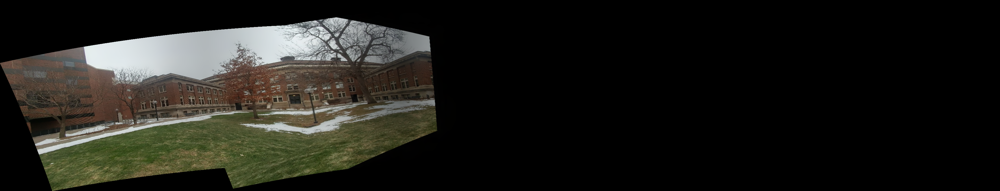

In [48]:
stitcher = cv.Stitcher_create()
status, panorama = stitcher.stitch([warped_image1, warped_image2])

print(status)
cv2_imshow(panorama)

if status == cv.Stitcher_OK:
    cv2_imshow(panorama)
    cv.waitKey(0)
    cv.destroyAllWindows()
else:
    print("Error during stitching.")


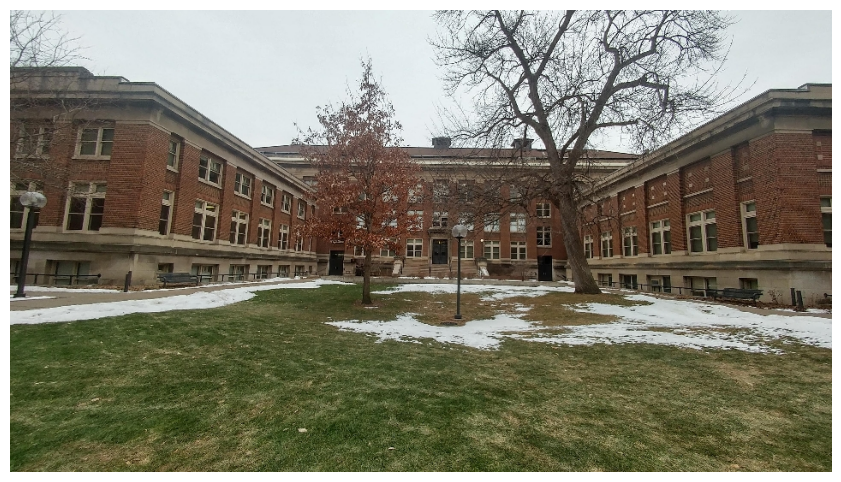

In [53]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

def stitch_images(image1, image2, H):
    warped_image = cv.warpPerspective(image1, H, (image2.shape[1] + image1.shape[1], image2.shape[0]))
    warped_image[0:image2.shape[0], 0:image2.shape[1]] = image2

    return warped_image

def crop_panorama(panorama):
    gray = cv.cvtColor(panorama, cv.COLOR_BGR2GRAY)
    _, thresh = cv.threshold(gray, 1, 255, cv.THRESH_BINARY)
    contours, _ = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    x, y, w, h = cv.boundingRect(contours[0])
    panorama_cropped = panorama[y:y+h, x:x+w]
    return panorama_cropped

panorama_stitched = stitch_images(img1, img2, M)
panorama_cropped = crop_panorama(panorama_stitched)

plt.figure(figsize=(12, 6))
plt.imshow(cv.cvtColor(panorama_cropped, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


6. Multi Stitching

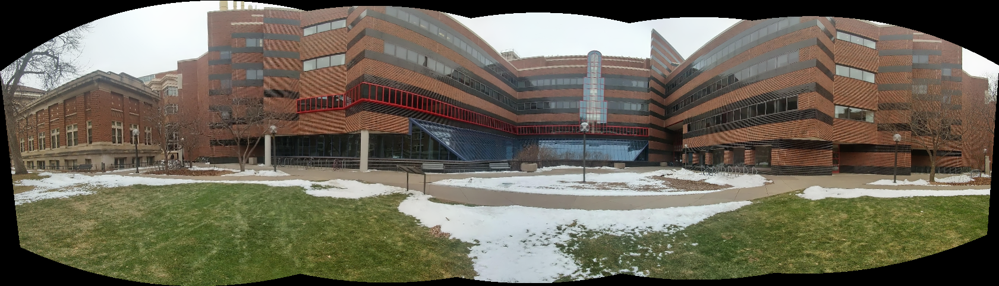

In [55]:
import os

def multi_stitch(images):
    stitcher = cv.Stitcher_create()
    status, stitched_image = stitcher.stitch(images)
    if status == cv.Stitcher_OK:
        return stitched_image
    else:
        print("Stitching failed")
        return None

images = []
for filename in os.listdir(dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        image = cv.imread(os.path.join(dir, filename))
        if image is not None:
            images.append(image)

stitched_image = multi_stitch(images)

if stitched_image is not None:
    cv2_imshow(stitched_image)
    cv.waitKey(0)
    cv.destroyAllWindows()
else:
    print("Failed to stitch images.")
